## Исследование надёжности заёмщиков

Заказчик — кредитный отдел банка. Нужно разобраться, влияет ли семейное положение и количество детей клиента на факт погашения кредита в срок. Входные данные от банка — статистика о платёжеспособности клиентов.

Результаты исследования будут учтены при построении модели **кредитного скоринга** — специальной системы, которая оценивает способность потенциального заёмщика вернуть кредит банку.

### Описание данных

* children — количество детей в семье
* days_employed — общий трудовой стаж в днях
* dob_years — возраст клиента в годах
* education — уровень образования клиента
* education_id — идентификатор уровня образования
* family_status — семейное положение
* family_status_id — идентификатор семейного положения
* gender — пол клиента
* income_type — тип занятости
* debt — имел ли задолженность по возврату кредитов
* total_income — ежемесячный доход
* purpose — цель получения кредита

### Содержание<a id="content"></a>

1. [Загрузка данных](#load_data)
2. [Предобработка данных](#data_preprocessing)
    * [Обработка пропущенных значений](#missing_values)
    * [Замена типов](#data_typization)
    * [Обработка аномалий](#anomalies)
    * [Обработка дубликатов](#duplicates)
    * [Лемматизация](#lemmatization)
    * [Категоризация данных](#categorization)
3. [Анализ данных](#data_analysis)
4. [Заключение](#conclusion)

<a id="load_data"></a>

### Шаг 1. Откройте файл с данными и изучите общую информацию.

In [1]:
BOLD = '\033[1m' # Данная строка является началом вывода тектста жирным шрифтом
END = '\033[0m' #  Это конец жирного шрифта

# Импортируем библиотеки
import warnings
warnings.filterwarnings('ignore')

from IPython.display import display

import matplotlib.pyplot as plt
import pandas as pd
import plotly.express as px
import plotly.io as pio
import plotly.offline as pyo

pio.renderers.default = 'iframe'
pyo.init_notebook_mode()


# Напишем функцию для вывода текста жирным шрифтом
def print_bold(text):
    print(BOLD + text + END)

# Считаем файл с датасетом
stat_df = pd.read_csv('data.csv')

# Выведем информацию о датасете
print_bold('Общая информация о датасете')
print(stat_df.info())
print_bold('\nНазвания столбцов')
print(stat_df.columns)
print_bold('\nСтатистическое описание датасета') # для количественных признаков
display(stat_df.describe())
print_bold('\nУникальные значения столбца') # для категориальных признаков
for col in stat_df.columns:
    if stat_df[col].dtype  == 'O': # здесь 'O' соответствует типу 'object'
        print_bold(col)
        print(stat_df[col].unique(), '\n')

Общая информация о датасете
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21525 entries, 0 to 21524
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   children          21525 non-null  int64  
 1   days_employed     19351 non-null  float64
 2   dob_years         21525 non-null  int64  
 3   education         21525 non-null  object 
 4   education_id      21525 non-null  int64  
 5   family_status     21525 non-null  object 
 6   family_status_id  21525 non-null  int64  
 7   gender            21525 non-null  object 
 8   income_type       21525 non-null  object 
 9   debt              21525 non-null  int64  
 10  total_income      19351 non-null  float64
 11  purpose           21525 non-null  object 
dtypes: float64(2), int64(5), object(5)
memory usage: 2.0+ MB
None

Названия столбцов
Index(['children', 'days_employed', 'dob_years', 'education', 'education_id',
       'family_status', 'family_status_id

,children,days_employed,dob_years,education_id,family_status_id,debt,total_income
count,21525.000000,19351.000000,21525.000000,21525.000000,21525.000000,21525.000000,1.935100e+04
mean,0.538908,63046.497661,43.293380,0.817236,0.972544,0.080883,1.674223e+05
std,1.381587,140827.311974,12.574584,0.548138,1.420324,0.272661,1.029716e+05
min,-1.000000,-18388.949901,0.000000,0.000000,0.000000,0.000000,2.066726e+04
25%,0.000000,-2747.423625,33.000000,1.000000,0.000000,0.000000,1.030532e+05
50%,0.000000,-1203.369529,42.000000,1.000000,0.000000,0.000000,1.450179e+05
75%,1.000000,-291.095954,53.000000,1.000000,1.000000,0.000000,2.034351e+05
max,20.000000,401755.400475,75.000000,4.000000,4.000000,1.000000,2.265604e+06



Уникальные значения столбца
education
['высшее' 'среднее' 'Среднее' 'СРЕДНЕЕ' 'ВЫСШЕЕ' 'неоконченное высшее'
 'начальное' 'Высшее' 'НЕОКОНЧЕННОЕ ВЫСШЕЕ' 'Неоконченное высшее'
 'НАЧАЛЬНОЕ' 'Начальное' 'Ученая степень' 'УЧЕНАЯ СТЕПЕНЬ'
 'ученая степень'] 

family_status
['женат / замужем' 'гражданский брак' 'вдовец / вдова' 'в разводе'
 'Не женат / не замужем'] 

gender
['F' 'M' 'XNA'] 

income_type
['сотрудник' 'пенсионер' 'компаньон' 'госслужащий' 'безработный'
 'предприниматель' 'студент' 'в декрете'] 

purpose
['покупка жилья' 'приобретение автомобиля' 'дополнительное образование'
 'сыграть свадьбу' 'операции с жильем' 'образование'
 'на проведение свадьбы' 'покупка жилья для семьи' 'покупка недвижимости'
 'покупка коммерческой недвижимости' 'покупка жилой недвижимости'
 'строительство собственной недвижимости' 'недвижимость'
 'строительство недвижимости' 'на покупку подержанного автомобиля'
 'на покупку своего автомобиля' 'операции с коммерческой недвижимостью'
 'строительство жило

### Вывод

* Исходный набор данных представляет собой таблицу, состоящую из 12 столбцов-признаков и 21525 строк.
* Названия столбцов корректны (написаны одним стилем, латиницей, без пробелов).
* Типы данных соответствуют содержимому столбцов.
* Часть данных явно пропущена, а именно, в столбцах трудового стажа и ежемесячного дохода.
* Есть и неявные пропуски данных:
    * значение "-1" в столбце "наличие детей"
    * нулевой возраст клиента
    * неопределённый пол "XNA"
* Заметны аномальные значения:
    * значение "20" в столбце "наличие детей"
    * отрицательные значения стажа работы, неестественное максимальное значение стажа, а также избыточная информация в виде большого количества десятичных знаков в столбцах стажа и ежемесячного дохода
* Образование записано в различном стиле (разных регистрах), что необходимо будет исправить в дальнейшем.
* Цели кредита не удобны для анализа, необходима категоризация.

In [2]:
def info(data):

    """
    Функция пробегает по признакам датафрейма и если тип у признака object, то смотрит уникальные значения, в противном случае 
    оценивается распределение
    """
    
    for column in data.columns:
    
        if data[column].dtype == 'object':
            
            print(column)
            print(data[column].unique())
            print()
            print(data[column].describe())
            print()
            
            
        else:
            
            print(column)
            print(data[column].describe())
            fig = px.histogram(data, x = column, marginal = 'box', title = 'Распределение '+ column)
            pyo.iplot(fig)
            
info(stat_df)

children
count    21525.000000
mean         0.538908
std          1.381587
min         -1.000000
25%          0.000000
50%          0.000000
75%          1.000000
max         20.000000
Name: children, dtype: float64


days_employed
count     19351.000000
mean      63046.497661
std      140827.311974
min      -18388.949901
25%       -2747.423625
50%       -1203.369529
75%        -291.095954
max      401755.400475
Name: days_employed, dtype: float64


dob_years
count    21525.000000
mean        43.293380
std         12.574584
min          0.000000
25%         33.000000
50%         42.000000
75%         53.000000
max         75.000000
Name: dob_years, dtype: float64


education
['высшее' 'среднее' 'Среднее' 'СРЕДНЕЕ' 'ВЫСШЕЕ' 'неоконченное высшее'
 'начальное' 'Высшее' 'НЕОКОНЧЕННОЕ ВЫСШЕЕ' 'Неоконченное высшее'
 'НАЧАЛЬНОЕ' 'Начальное' 'Ученая степень' 'УЧЕНАЯ СТЕПЕНЬ'
 'ученая степень']

count       21525
unique         15
top       среднее
freq        13750
Name: education, dtype: object

education_id
count    21525.000000
mean         0.817236
std          0.548138
min          0.000000
25%          1.000000
50%          1.000000
75%          1.000000
max          4.000000
Name: education_id, dtype: float64


family_status
['женат / замужем' 'гражданский брак' 'вдовец / вдова' 'в разводе'
 'Не женат / не замужем']

count               21525
unique                  5
top       женат / замужем
freq                12380
Name: family_status, dtype: object

family_status_id
count    21525.000000
mean         0.972544
std          1.420324
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          4.000000
Name: family_status_id, dtype: float64


gender
['F' 'M' 'XNA']

count     21525
unique        3
top           F
freq      14236
Name: gender, dtype: object

income_type
['сотрудник' 'пенсионер' 'компаньон' 'госслужащий' 'безработный'
 'предприниматель' 'студент' 'в декрете']

count         21525
unique            8
top       сотрудник
freq          11119
Name: income_type, dtype: object

debt
count    21525.000000
mean         0.080883
std          0.272661
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: debt, dtype: float64


total_income
count    1.935100e+04
mean     1.674223e+05
std      1.029716e+05
min      2.066726e+04
25%      1.030532e+05
50%      1.450179e+05
75%      2.034351e+05
max      2.265604e+06
Name: total_income, dtype: float64


purpose
['покупка жилья' 'приобретение автомобиля' 'дополнительное образование'
 'сыграть свадьбу' 'операции с жильем' 'образование'
 'на проведение свадьбы' 'покупка жилья для семьи' 'покупка недвижимости'
 'покупка коммерческой недвижимости' 'покупка жилой недвижимости'
 'строительство собственной недвижимости' 'недвижимость'
 'строительство недвижимости' 'на покупку подержанного автомобиля'
 'на покупку своего автомобиля' 'операции с коммерческой недвижимостью'
 'строительство жилой недвижимости' 'жилье'
 'операции со своей недвижимостью' 'автомобили' 'заняться образованием'
 'сделка с подержанным автомобилем' 'получение образования' 'автомобиль'
 'свадьба' 'получение дополнительного образования' 'покупка своего жилья'
 'операции с недвижимостью' 'получение высшего образования'
 'свой автомобиль' 'сделка с автомобилем' 'профильное образование'
 'высшее образование' 'покупка жилья для сдачи' 'на покупку автомобиля'
 'ремонт жилью' 'заняться высшим образованием']

count       21525
un

<a id="data_preprocessing"></a>

### Шаг 2. Предобработка данных

<a id="missing_values"></a>
### Обработка пропусков

Посмотрим, сколько явных пропусков в данных.

In [3]:
stat_df.isnull().sum()

children               0
days_employed       2174
dob_years              0
education              0
education_id           0
family_status          0
family_status_id       0
gender                 0
income_type            0
debt                   0
total_income        2174
purpose                0
dtype: int64

Проверим, сколько пропущенных значений в столбце с ежемесячным доходом совпадает с пропущенными значениями в столбце с общим трудовым стажем.

In [4]:
rows_with_double_miss = stat_df[stat_df['days_employed'].isnull()]['total_income'].isnull().sum()
print('Строк с пропущенными значениями в столбцах стажа и дохода:', rows_with_double_miss)

Строк с пропущенными значениями в столбцах стажа и дохода: 2174


Это означает, что там, где пропущен общий трудовой стаж, пропущен и ежемесячный доход, что не похоже на абсолютную случайность. Возможно, эти клиенты специально не указали стаж и доход.  

Проверим, нет ли зависимости между значениями каждого заполненного столбца и пропущенными значениями.

In [5]:
for col in stat_df.columns:
    if col != 'days_employed' and col != 'total_income':
        count_categories_percentage = stat_df[stat_df['days_employed'].isnull()]\
            .groupby(col)[col].count() / rows_with_double_miss * 100
        print(count_categories_percentage, '\n')

children
-1      0.137994
 0     66.191352
 1     21.849126
 2      9.383625
 3      1.655934
 4      0.321987
 5      0.045998
 20     0.413983
Name: children, dtype: float64 

dob_years
0     0.459982
19    0.045998
20    0.229991
21    0.827967
22    0.781969
23    1.655934
24    0.965961
25    1.057958
26    1.609936
27    1.655934
28    2.621895
29    2.299908
30    2.667893
31    2.989880
32    1.701932
33    2.345906
34    3.173873
35    2.943882
36    2.897884
37    2.437902
38    2.483901
39    2.345906
40    3.035879
41    2.713891
42    2.989880
43    2.299908
44    2.023919
45    2.299908
46    2.207912
47    2.713891
48    2.115915
49    2.299908
50    2.345906
51    2.299908
52    2.437902
53    2.023919
54    2.529899
55    2.207912
56    2.483901
57    2.575897
58    2.575897
59    1.563937
60    1.793928
61    1.747930
62    1.747930
63    1.333947
64    1.701932
65    0.919963
66    0.919963
67    0.735971
68    0.413983
69    0.229991
70    0.137994
71    0.229991
72

Явной зависимости нет, однако заметно преобладание некоторых категорий над другими: примерно 66% не указавших стаж и доход не имеют детей, примерно 71% имеют среднее образование, примерно 57% женаты, примерно 68% - женщины, 51% - сотрудники, при этом 92% не имеют задолженности по кредитам.  
Для более полного понимания построим дерево с помощью группировки по перечисленным выше признакам в порядке убывания процента от числа не указавших стаж и доход и выведем топ-10 веток по проценту от того же числа людей (2174). Начнём группировать по всем обозначеным признакам: имеет ли задолженность, образование (id), количество детей, пол, семейное положение (id).

In [6]:
stat_tree = stat_df[stat_df['days_employed'].isnull()].groupby(
    ['debt', 'education_id', 'gender', 'children', 'family_status_id']
)['gender'].count() / rows_with_double_miss * 100

stat_tree.sort_values(ascending=False).head(10)

debt  education_id  gender  children  family_status_id
0     1             F       0         0                   16.789328
                    M       0         0                    7.359706
                    F       0         1                    6.071757
                            1         0                    5.749770
      0             F       0         0                    4.415823
      1             F       0         4                    3.587856
                                      2                    3.127875
                    M       1         0                    2.943882
      0             M       0         0                    2.805888
                    F       1         0                    2.805888
Name: gender, dtype: float64

Видно, что нет явно доминирующей ветви категорий: 1 место составляет всего лишь 16.8%. Тем не менее, набор значений категорий 1го места указывает на то, что большинство каждой отдельной категории составляют одни и те же клиенты: не имеющие задолженностей по кредитам, со средним образованием, замужние женщины без детей.

Теперь возможны два пути: либо удаляем, либо заполняем пропуски.
В первом случае из рассмотрения будет изъято примерно 10%, что достаточно ощутимо; также данные пропуски не совсем случайны, поэтому предпочтителен второй путь. Заполнение пропущенных значений, в данном случае количественных показателей, - также задача с выбором, т.к. в зависимости от тех значений, которыми будут заполнены пропуски, будет зависеть качество выводов. Предлагаем заполнить пропуски медианой, перед этим проанализировав распределение медианных значений по типу занятости с целью повышения гибкости заполнения пропусков.

In [35]:
import plotly.express as px

fig = px.line(stat_df.pivot_table(index = 'income_type', values = 'total_income', aggfunc = 'median').reset_index(),
             x = 'income_type', y = 'total_income')
pyo.iplot(fig)

Посмотрим сначала на ежемесячный доход.

In [8]:
old_pivot = stat_df.pivot_table(index='income_type', values='total_income', aggfunc='median').sort_values(by='total_income',
                                                                                                          ascending=False)
old_pivot

,total_income
income_type,
предприниматель,499163.144947
компаньон,172357.950966
госслужащий,150447.935283
сотрудник,142594.396847
безработный,131339.751676
пенсионер,118514.486412
студент,98201.625314
в декрете,53829.130729


Видим, что медиана сильно разнится в зависимости от типа занятости, поэтому заполним пропуски медианами в соответствующих категориях.

In [9]:
for income_type in stat_df['income_type'].unique():
    filtered_ex_nan = stat_df[(stat_df['income_type'] == income_type) & ~(stat_df['total_income'].isna())]['total_income']
    stat_df.loc[(stat_df['income_type'] == income_type) &\
                (stat_df['total_income'].isna()), 'total_income'] = filtered_ex_nan.median()
print('Пропущенных значений дохода после обработки:', stat_df['total_income'].isnull().sum())
print_bold('\nРазность медиан по категориям до и после обработки')
cur_pivot = stat_df.pivot_table(index='income_type', values='total_income', aggfunc='median').sort_values(by='total_income',
                                                                                                          ascending=False)
old_pivot - cur_pivot

Пропущенных значений дохода после обработки: 0

Разность медиан по категориям до и после обработки


,total_income
income_type,
предприниматель,0.0
компаньон,0.0
госслужащий,0.0
сотрудник,0.0
безработный,0.0
пенсионер,0.0
студент,0.0
в декрете,0.0


Пропуски в доходах заполнили корректно.

Чтобы заполнить пропуски в трудовом стаже необходимо обработать аномальные значения.<a id="missing_values_1"></a>
Минус в значениях стажа мог появиться из-за разных причин, в предположении, что число верно, уберём знак "минус".

In [10]:
stat_df['days_employed'] = stat_df['days_employed'].apply(abs)
print('Всего отрицательных значений в столбце "стаж":',
      stat_df[stat_df['days_employed'] < 0]['days_employed'].count())

Всего отрицательных значений в столбце "стаж": 0


Теперь нужно разобраться с неестественно большими значениями стажа.

<AxesSubplot:>

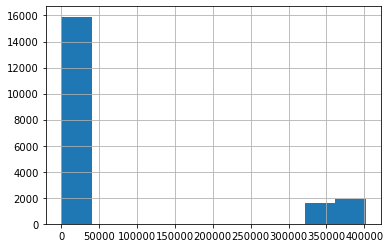

In [11]:
stat_df['days_employed'].hist()

Видно, что неестественные значения на порядок больше значений из основной группы, что наводит на мысль, что данные значения соответствуют стажу не в днях, а в более мелких единицах измерения.

In [12]:
stat_df[stat_df['days_employed'] > 50000]['days_employed'].max() /\
    stat_df[stat_df['days_employed'] < 50000]['days_employed'].max()

21.84765321824669

Максимальные значения двух групп отличаются почти в 22 раза, возможно, часть значений стажа была указана в часах (вопросы по части базы данных). Поделим экстремальные значения на 24.

<AxesSubplot:>

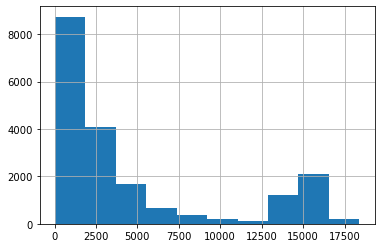

In [13]:
stat_df.loc[stat_df['days_employed'] > 50000, 'days_employed'] /= 24
stat_df['days_employed'].hist()

Теперь проанализируем стаж внутри каждого типа занятости.

In [14]:
old_pivot = stat_df.pivot_table(index='income_type', values='days_employed', aggfunc='median').sort_values(by='days_employed',
                                                                                                           ascending=False)
old_pivot

,days_employed
income_type,
безработный,15267.235531
пенсионер,15217.221094
в декрете,3296.759962
госслужащий,2689.368353
сотрудник,1574.202821
компаньон,1547.382223
студент,578.751554
предприниматель,520.848083


Видим, что медиана сильно разнится в зависимости от типа занятости, поэтому заполним пропуски медианами в соответствующих категориях.

In [15]:
for income_type in stat_df['income_type'].unique():
    filtered_ex_nan = stat_df[(stat_df['income_type'] == income_type) & ~(stat_df['days_employed'].isna())]['days_employed']
    stat_df.loc[(stat_df['income_type'] == income_type) &\
                (stat_df['days_employed'].isna()), 'days_employed'] = filtered_ex_nan.median()
print('Пропущенных значений стажа после обработки:', stat_df['days_employed'].isnull().sum())
print_bold('\nРазность медиан по категориям до и после обработки')
cur_pivot = stat_df.pivot_table(index='income_type', values='days_employed', aggfunc='median').sort_values(by='days_employed',
                                                                                                           ascending=False)
old_pivot - cur_pivot

Пропущенных значений стажа после обработки: 0

Разность медиан по категориям до и после обработки


,days_employed
income_type,
безработный,0.0
пенсионер,0.0
в декрете,0.0
госслужащий,0.0
сотрудник,0.0
компаньон,0.0
студент,0.0
предприниматель,0.0


Пропуски в стаже заполнили корректно.

Чтобы в дальнейшем было удобнее работать со стажем, добавим столбец со стажем в годах.

In [16]:
stat_df['years_employed'] = stat_df['days_employed'] / 365
stat_df['years_employed'] = stat_df['years_employed'].astype('int')
cols = stat_df.columns.tolist()
cols = [*cols[:2], cols[-1], *cols[2:-1]]
stat_df = stat_df[cols]
stat_df.head()

,children,days_employed,years_employed,dob_years,education,education_id,family_status,family_status_id,gender,income_type,debt,total_income,purpose
0,1,8437.673028,23,42,высшее,0,женат / замужем,0,F,сотрудник,0,253875.639453,покупка жилья
1,1,4024.803754,11,36,среднее,1,женат / замужем,0,F,сотрудник,0,112080.014102,приобретение автомобиля
2,0,5623.422610,15,33,Среднее,1,женат / замужем,0,M,сотрудник,0,145885.952297,покупка жилья
3,3,4124.747207,11,32,среднее,1,женат / замужем,0,M,сотрудник,0,267628.550329,дополнительное образование
4,0,14177.753002,38,53,среднее,1,гражданский брак,1,F,пенсионер,0,158616.077870,сыграть свадьбу


In [17]:
stat_df['years_employed'].max()

50

Максимальный стаж - 50 лет, что попадает в рамки разумного.

Теперь обработаем неявные пропуски. Начнём с наличия детей.  
Посмотрим, какую долю составляет значение "-1" от всех значений.

In [18]:
stat_df[stat_df['children'] == -1]['children'].count() / stat_df['children'].count() * 100

0.2183507549361208

Десятые доли процента, значит, можно заменить "-1" на самое популярное значение данного признака, что не должно значимо повлиять на распределение признака.

Мода признака "наличие детей": 0


<AxesSubplot:>

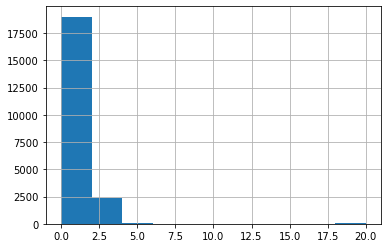

In [19]:
print('Мода признака "наличие детей":', stat_df['children'].mode().values[0])
stat_df.loc[stat_df['children'] == -1, 'children'] = int(stat_df['children'].mode())
stat_df['children'].hist()

То же проделаем с нулевым возрастом клиента.

In [20]:
stat_df[stat_df['dob_years'] == 0]['dob_years'].count() / stat_df['dob_years'].count() * 100

0.4692218350754936

Десятые доли процента, значит, можно заменить "0" на медиану, что не должно значимо повлиять на распределение признака.

Медиана признака "возраст": 42.0


<AxesSubplot:>

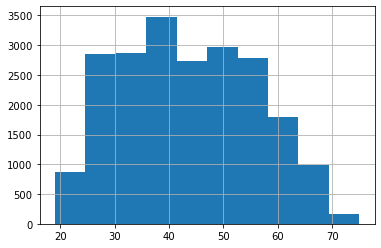

In [21]:
print('Медиана признака "возраст":', stat_df['dob_years'].median())
stat_df.loc[stat_df['dob_years'] == 0, 'dob_years'] = int(stat_df['dob_years'].median())
stat_df['dob_years'].hist()

Остался признак пола. Выведем записи с неопределённым полом.

In [22]:
stat_df[stat_df['gender'] == 'XNA']

,children,days_employed,years_employed,dob_years,education,education_id,family_status,family_status_id,gender,income_type,debt,total_income,purpose
10701,0,2358.600502,6,24,неоконченное высшее,2,гражданский брак,1,XNA,компаньон,0,203905.157261,покупка недвижимости


Всего одна запись, удаление которой не вызовет сколько-нибудь заметного изменения в данных.

In [23]:
stat_df.drop(index=stat_df[stat_df['gender'] == 'XNA'].index, inplace=True)
stat_df['gender'].unique()

array(['F', 'M'], dtype=object)

### Вывод

Изучение пропущенных значений дало следующие результаты:
* пропуски значений трудового стажа и месячного дохода встречаются ровно в 2174 записях, что составляет примерно 10% от общего числа записей, что делает удаление пропусков причиной потери ощутимой доли информации;
* решено было заменить пропущенные значения на медианы в зависимости от типа занятости;
* при этом были обработаны аномальные значения стажа:
    * отрицательные заменены по модулю при верности предположения о корректности самих чисел
    * экстремально большие приведены к дням, отталкиваясь от гипотезы, что данные значения представлены в часах
* для удобства работы со значениями стажа добавлен столбец стажа в годах;
* значения "-1" в столбце "наличие детей" были заменены на самое популярное значение этого признака - "0";
* значения "0" в столбце "возраст клиента" были заменены на медиану;
* единственная запись без определённого пола была удалена.

<a id="data_typization"></a>
### Замена типа данных

Так как трудовой стаж обычно исчисляется месяцами и годами, то округлим значения до дней, приведя к целочисленному типу; то же проделаем и со столбцом ежемесячного дохода.

In [24]:
stat_df[['days_employed', 'total_income']] = stat_df[['days_employed', 'total_income']].astype('int')
stat_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21524 entries, 0 to 21524
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   children          21524 non-null  int64 
 1   days_employed     21524 non-null  int32 
 2   years_employed    21524 non-null  int32 
 3   dob_years         21524 non-null  int64 
 4   education         21524 non-null  object
 5   education_id      21524 non-null  int64 
 6   family_status     21524 non-null  object
 7   family_status_id  21524 non-null  int64 
 8   gender            21524 non-null  object
 9   income_type       21524 non-null  object
 10  debt              21524 non-null  int64 
 11  total_income      21524 non-null  int32 
 12  purpose           21524 non-null  object
dtypes: int32(3), int64(5), object(5)
memory usage: 2.1+ MB


In [25]:
stat_df.head()

,children,days_employed,years_employed,dob_years,education,education_id,family_status,family_status_id,gender,income_type,debt,total_income,purpose
0,1,8437,23,42,высшее,0,женат / замужем,0,F,сотрудник,0,253875,покупка жилья
1,1,4024,11,36,среднее,1,женат / замужем,0,F,сотрудник,0,112080,приобретение автомобиля
2,0,5623,15,33,Среднее,1,женат / замужем,0,M,сотрудник,0,145885,покупка жилья
3,3,4124,11,32,среднее,1,женат / замужем,0,M,сотрудник,0,267628,дополнительное образование
4,0,14177,38,53,среднее,1,гражданский брак,1,F,пенсионер,0,158616,сыграть свадьбу


### Вывод

Для столбцов с трудовым стажем и ежемесячным доходом тип данных был заменён на целочисленный методом *astype()* (т.к. данные занимают немного памяти, нет необходимости в её оптимизации, поэтому просто меняем *float64* на *int64*).

<a id="duplicates"></a>
### Обработка дубликатов

Посмотрим, сколько записей продублировано в датафрейме.

In [26]:
len(stat_df[stat_df.duplicated()])

55

Удалим соответствующие записи.

In [27]:
stat_df = stat_df.drop_duplicates().reset_index(drop=True)
stat_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21469 entries, 0 to 21468
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   children          21469 non-null  int64 
 1   days_employed     21469 non-null  int32 
 2   years_employed    21469 non-null  int32 
 3   dob_years         21469 non-null  int64 
 4   education         21469 non-null  object
 5   education_id      21469 non-null  int64 
 6   family_status     21469 non-null  object
 7   family_status_id  21469 non-null  int64 
 8   gender            21469 non-null  object
 9   income_type       21469 non-null  object
 10  debt              21469 non-null  int64 
 11  total_income      21469 non-null  int32 
 12  purpose           21469 non-null  object
dtypes: int32(3), int64(5), object(5)
memory usage: 1.9+ MB


Рассмотрим столбцы с категориальными строковыми переменными с целью поиска неявных дубликатов. Выведем уникальные значения для каждого такого столбца.

In [28]:
print_bold('Уникальные значения для столбца')
for col in stat_df.columns:
    if stat_df[col].dtype  == 'O': # здесь 'O' соответствует типу 'object'
        print_bold(col)
        print(stat_df[col].unique(), '\n')

Уникальные значения для столбца
education
['высшее' 'среднее' 'Среднее' 'СРЕДНЕЕ' 'ВЫСШЕЕ' 'неоконченное высшее'
 'начальное' 'Высшее' 'НЕОКОНЧЕННОЕ ВЫСШЕЕ' 'Неоконченное высшее'
 'НАЧАЛЬНОЕ' 'Начальное' 'Ученая степень' 'УЧЕНАЯ СТЕПЕНЬ'
 'ученая степень'] 

family_status
['женат / замужем' 'гражданский брак' 'вдовец / вдова' 'в разводе'
 'Не женат / не замужем'] 

gender
['F' 'M'] 

income_type
['сотрудник' 'пенсионер' 'компаньон' 'госслужащий' 'безработный'
 'предприниматель' 'студент' 'в декрете'] 

purpose
['покупка жилья' 'приобретение автомобиля' 'дополнительное образование'
 'сыграть свадьбу' 'операции с жильем' 'образование'
 'на проведение свадьбы' 'покупка жилья для семьи' 'покупка недвижимости'
 'покупка коммерческой недвижимости' 'покупка жилой недвижимости'
 'строительство собственной недвижимости' 'недвижимость'
 'строительство недвижимости' 'на покупку подержанного автомобиля'
 'на покупку своего автомобиля' 'операции с коммерческой недвижимостью'
 'строительство жилой н

Видно, что есть несогласованные данные в столбце *'education'*, т.е. данные представлены в разных регистрах, что может свидетельствовать о некорректной обработке данного поля заполняемой формы.

Приведём все значения столбца *'education'* к нижнему регистру и проверим, что уникальные значения в данном столбце действительно являются уникальными.

In [29]:
stat_df['education'] = stat_df['education'].str.lower()
print(stat_df['education'].unique())

['высшее' 'среднее' 'неоконченное высшее' 'начальное' 'ученая степень']


Теперь проверим, что каждой категории образования соответствует один идентификатор, а каждому семейному положению - свой идентификатор.

In [30]:
print_bold('Проверка на соответствие идентификаторов образования')
print(stat_df.groupby(['education', 'education_id'])['education_id'].count())
print_bold('\nПроверка на соответствие идентификаторов семейного статуса')
print(stat_df.groupby(['family_status', 'family_status_id'])['family_status_id'].count())

Проверка на соответствие идентификаторов образования
education            education_id
высшее               0                5251
начальное            3                 282
неоконченное высшее  2                 743
среднее              1               15187
ученая степень       4                   6
Name: education_id, dtype: int64

Проверка на соответствие идентификаторов семейного статуса
family_status          family_status_id
Не женат / не замужем  4                    2810
в разводе              3                    1195
вдовец / вдова         2                     959
гражданский брак       1                    4161
женат / замужем        0                   12344
Name: family_status_id, dtype: int64


Перепроверим датафрейм на наличие явных дубликатов.

In [31]:
len(stat_df[stat_df.duplicated()])

17

Удалим соответствующие записи.

In [32]:
stat_df = stat_df.drop_duplicates().reset_index(drop=True)
stat_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21452 entries, 0 to 21451
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   children          21452 non-null  int64 
 1   days_employed     21452 non-null  int32 
 2   years_employed    21452 non-null  int32 
 3   dob_years         21452 non-null  int64 
 4   education         21452 non-null  object
 5   education_id      21452 non-null  int64 
 6   family_status     21452 non-null  object
 7   family_status_id  21452 non-null  int64 
 8   gender            21452 non-null  object
 9   income_type       21452 non-null  object
 10  debt              21452 non-null  int64 
 11  total_income      21452 non-null  int32 
 12  purpose           21452 non-null  object
dtypes: int32(3), int64(5), object(5)
memory usage: 1.9+ MB


### Вывод

Поиск дубликатов был проведён в четыре этапа:
* по всему датафрейму на наличие явных дубликатов;
* сначала в строковых категориальных признаках, чтобы найти несогласованные данные;
* затем на соответствие идентификаторов соответствующим категориям;
* перепроверка на наличие явных дубликатов.

<a id="anomalies"></a>
### Обработка аномальных значений

Для полной картины выведем все уникальные значения столбцов датафрейма.

In [33]:
for col in stat_df.columns:
    print_bold(col)
    print(stat_df[col].value_counts(), '\n')

children
0     14136
1      4808
2      2052
3       330
20       76
4        41
5         9
Name: children, dtype: int64 

days_employed
1574     1070
1547      505
15217     387
2689      152
133        16
         ... 
5976        1
15125       1
3931        1
2006        1
2049        1
Name: days_employed, Length: 7787, dtype: int64 

years_employed
4     2920
1     2024
2     1878
0     1827
3     1560
5     1024
6      964
7      955
41     798
8      748
9      572
10     455
42     452
38     450
39     418
40     409
44     386
43     385
11     379
45     371
12     345
13     284
14     251
15     205
37     198
16     134
19     124
17     117
18      98
20      90
21      88
22      81
23      65
24      53
25      51
26      50
27      46
30      34
29      30
32      28
31      27
28      25
33      17
35      12
34      12
36      10
50       1
48       1
Name: years_employed, dtype: int64 

dob_years
42    696
35    616
40    607
41    605
34    601
38    597
33    58

Часть аномальных значений была обработана вместе с [пропущенными значениями](#missing_values_1). Необработанным осталось значение числа детей "20" (для настоящего времени это очень редкое явление, пару веков назад это было бы не так удивительно). Предположение:
* при наборе числа детей произошла опечатка, так как цифра "2" на цифровом блоке клавиатуры находится рядом с цифрой "0", тогда детей на самом деле может быть "0" или "2" (а возможно, что и "1", и "10");
* либо при сборе, обработке информации произошёл сбой в работе оборудования (возможно, но маловероятно).

Таких записей достаточно мало (меньше 0.4%), поэтому можно заменить "2", при этом распределение числа детей заметно не изменится.

In [34]:
stat_df.loc[stat_df['children'] == 20, 'children'] = 2
stat_df['children'].value_counts()

0    14136
1     4808
2     2128
3      330
4       41
5        9
Name: children, dtype: int64

### Вывод

В данных были обнаружены аномальные значения: по числу детей потребуется поднять большой пласт информации и привлечь специалистов из различных отделов, чтобы докопаться до истинной причины появления записей, в которых число детей равно "20" - тем не менее, для дальнейшего анализа данных решено было заменить значение "20" на "2".

<a id="lemmatization"></a>
### Лемматизация

In [163]:
# Импортируем библиотеки для лемматизации и подсчёта
from pymystem3 import Mystem
from collections import Counter
from tqdm import tqdm
from joblib import Parallel, delayed

def lemmatize_parallelize(texts, batch_size=1000, n_jobs=-1) -> list:
    """
    Лемматизирует текст, представленный в виде итерируемого объекта,
    при этом имеется возможность распараллелить работу.
    
    Аргументы
    ---------
    texts : iterable
        Список или серия панд, которая содержит строковые значения.
    batch_size : int, default=1000
        Размер партии строк для параллельной лемматизации.
    n_jobs : int, default=-1
        Максимальное количество одновременно выполняемых лемматизаций (1 <=> последовательно,
        n_jobs < 0 <=> количество потоков + 1 - n_jobs).
    
    Возвращает
    ----------
    list
        Список лемматизированных строк.
    """
    try:
        stem = Mystem()
    except NameError:
        from pymystem3 import Mystem
        stem = Mystem()

    text_batch = [texts[i: i + batch_size] for i in range(0, len(texts), batch_size)]

    def lemmatize(text):
        stem = Mystem()
        merged_text = "|".join(text)

        doc = []
        res = []

        for t in stem.lemmatize(merged_text):
            if t != '|':
                doc.append(t)
            else:
                res.append(doc)
                doc = []

        return res

    processed_texts = Parallel(n_jobs=-1)(delayed(lemmatize)(t) for t in tqdm(text_batch))
    
    result = processed_texts[0]
    [result.extend(processed_texts[i]) for i in range(1, len(processed_texts))]
    
    return result

# Лемматизируем цели кредитов и сохраним в отдельную переменную типа Series
lemmas_series = lemmatize_parallelize(list(stat_df['purpose']))
lemmas_series[0]

100%|██████████| 22/22 [00:01<00:00, 12.91it/s]


['покупка', ' ', 'жилье']

Перед тем, как приступить к категоризации данных, посчитаем частоты всех лемм из столбца "цель кредита".

In [111]:
all_purpose_words = ' '.join(stat_df['purpose'].unique())

stem = Mystem()
lemmas = stem.lemmatize(all_purpose_words)
lemmas_count = Counter(lemmas)
print(lemmas_count)

Counter({' ': 96, 'покупка': 10, 'недвижимость': 10, 'автомобиль': 9, 'образование': 9, 'жилье': 7, 'с': 5, 'операция': 4, 'на': 4, 'свой': 4, 'свадьба': 3, 'строительство': 3, 'получение': 3, 'высокий': 3, 'дополнительный': 2, 'для': 2, 'коммерческий': 2, 'жилой': 2, 'подержать': 2, 'заниматься': 2, 'сделка': 2, 'приобретение': 1, 'сыграть': 1, 'проведение': 1, 'семья': 1, 'собственный': 1, 'со': 1, 'профильный': 1, 'сдача': 1, 'ремонт': 1, '\n': 1})


In [112]:
lemmas_count.pop(' ')
lemmas_count.pop('\n')

1

In [126]:
d = dict(lemmas_count)

lemmas_count_df = pd.DataFrame([k, v] for k, v in d.items()).sort_values(by=1)

fig = px.bar(
    lemmas_count_df,
    x=1,
    y=0,
    orientation='h',
    height=800,
    labels={
        '0': 'Леммы',
        '1': 'Число появлений'
    },
    title='Число появлений лемм в цели кредита'
)
pyo.iplot(fig)

Отбросив все предлоги, глаголы, прилагательные, существительные действия и оставив только существительные, которые являются объектами кредита, выделим возможные категории: **недвижимость/жилье**, **автомобиль**, **образование**, **свадба** (мероприятие).

### Вывод

Цели кредита были лемматизированы, выделены возможные категории целей кредита.

<a id="categorization"></a>
### Категоризация данных

На основании предполагаемых категорий составим функцию для категоризации целей кредита, в которую заложим словарь, ключи которого будут категориями, а списки значений - ключевыми словами. В качестве аттрибута функция принимает столбец целей кредита, на выходе - список категорий; если ключевых слов не найдено, то в список добавляется категория "неопределено".

In [166]:
def get_category_from_purpose(lemmas):
    category_dict = {
        'недвижимость': ['недвижимость', 'жилье'],
        'авто': ['автомобиль'],
        'образование': ['образование'],
        'мероприятия': ['свадьба']
    }
    
    category_list = []
    for lemma in lemmas:
        check = 0
        for category, key_words in category_dict.items():
            for key_word in key_words:
                if key_word in lemma:
                    category_list.append(category)
                    check = 1
        if check == 0:
            category_list.append('неопределено')
    return category_list

Применим функцию и создадим на основе полученного списка новый столбец датафрейма.

In [167]:
stat_df['purpose_category'] = pd.Series(get_category_from_purpose(lemmas_series), name='purpose_category')
stat_df.head(10)

,children,days_employed,years_employed,dob_years,education,education_id,family_status,family_status_id,gender,income_type,debt,total_income,purpose,purpose_category
0,1,8437,23,42,высшее,0,женат / замужем,0,F,сотрудник,0,253875,покупка жилья,недвижимость
1,1,4024,11,36,среднее,1,женат / замужем,0,F,сотрудник,0,112080,приобретение автомобиля,авто
2,0,5623,15,33,среднее,1,женат / замужем,0,M,сотрудник,0,145885,покупка жилья,недвижимость
3,3,4124,11,32,среднее,1,женат / замужем,0,M,сотрудник,0,267628,дополнительное образование,образование
4,0,14177,38,53,среднее,1,гражданский брак,1,F,пенсионер,0,158616,сыграть свадьбу,мероприятия
5,0,926,2,27,высшее,0,гражданский брак,1,M,компаньон,0,255763,покупка жилья,недвижимость
6,0,2879,7,43,высшее,0,женат / замужем,0,F,компаньон,0,240525,операции с жильем,недвижимость
7,0,152,0,50,среднее,1,женат / замужем,0,M,сотрудник,0,135823,образование,образование
8,2,6929,18,35,высшее,0,гражданский брак,1,F,сотрудник,0,95856,на проведение свадьбы,мероприятия
9,0,2188,5,41,среднее,1,женат / замужем,0,M,сотрудник,0,144425,покупка жилья для семьи,недвижимость


Подсчитаем, сколько записей попало в каждую категорию.

In [168]:
stat_df['purpose_category'].value_counts()

недвижимость    10804
авто             4298
образование      4009
мероприятия      2319
Name: purpose_category, dtype: int64

### Вывод

Цели кредита были категоризированы для удобства классификации целей кредита. Категории были присвоены на основании словаря с ключевыми словами и лемматизированного столбца целей кредита.

<a id="data_analysis"></a>

### Шаг 3. Ответьте на вопросы

- Есть ли зависимость между наличием детей и возвратом кредита в срок?

Разделим клиентов на три группы по количеству детей и добавим этот столбец в датафрейм:
* 0 - бездетная семья
* 1-2 - среднестатистическая семья
* 3 и более - многодетная семья

In [169]:
family_category = ['childfree' if value == 0 else 'average' if value < 3 else 'large' for value in stat_df['children']]
stat_df['family_category'] = pd.Series(family_category)
cols = stat_df.columns.tolist()
cols = [cols[0], cols[-1], *cols[1:-1]]
stat_df = stat_df[cols]
stat_df.head()

,children,family_category,days_employed,years_employed,dob_years,education,education_id,family_status,family_status_id,gender,income_type,debt,total_income,purpose,purpose_category
0,1,average,8437,23,42,высшее,0,женат / замужем,0,F,сотрудник,0,253875,покупка жилья,недвижимость
1,1,average,4024,11,36,среднее,1,женат / замужем,0,F,сотрудник,0,112080,приобретение автомобиля,авто
2,0,childfree,5623,15,33,среднее,1,женат / замужем,0,M,сотрудник,0,145885,покупка жилья,недвижимость
3,3,large,4124,11,32,среднее,1,женат / замужем,0,M,сотрудник,0,267628,дополнительное образование,образование
4,0,childfree,14177,38,53,среднее,1,гражданский брак,1,F,пенсионер,0,158616,сыграть свадьбу,мероприятия


In [170]:
stat_df.groupby('family_category')['debt'].sum() / stat_df.groupby('family_category')['debt'].count() * 100

family_category
average      9.313725
childfree    7.526882
large        8.157895
Name: debt, dtype: float64

### Вывод

Процент невыплаченных кредитов немного отличается в зависимости от числа детей, но чтобы говорить о статистически значимом различии, необходимо выполнить проверку статистических гипотез.

In [171]:
def pivot(data, index):
    
    """
    Я решил написать функцию, которая строит сводную табличку и визуализирует ее, тут нет ничего сложного, смотри:
    на вход она принимает датафрейм и признак для группировки, далее строит сводную с подсчетом клиентов в категории (count),
    числа заемщиков (sum), % невозврата (mean). Тк признак debt бинарный, то такие аггрегирующие функции как нельзя кстати.
    """
    
    pivot = data.pivot_table(index = index, values = 'debt', aggfunc = ['count', 'sum', 'mean']).reset_index()
    pivot.columns = [index, 'Кол-во клиентов', 'Кол-во должников', '% невозврата']
    display(pivot.sort_values('% невозврата', ascending = False))
    
    import plotly.express as px #импортируем библиотеку визуализации 
    
    fig = px.bar(pivot, x = index, y = '% невозврата', color = '% невозврата', title = '% невозврата по ' + index)
    fig.show()
    

pivot(stat_df, 'family_category')

,family_category,Кол-во клиентов,Кол-во должников,% невозврата
0,average,6936,646,0.093137
2,large,380,31,0.081579
1,childfree,14136,1064,0.075269


- Есть ли зависимость между семейным положением и возвратом кредита в срок?

In [172]:
debt_percentage = stat_df.groupby('family_status')['debt'].sum() / stat_df.groupby('family_status')['debt'].count() * 100
debt_percentage.sort_values(ascending=False)

family_status
Не женат / не замужем    9.750890
гражданский брак         9.351651
женат / замужем          7.545182
в разводе                7.112971
вдовец / вдова           6.569343
Name: debt, dtype: float64

### Вывод

Незначительно больше невозвратов у неженатых/незамужних и тех клиентов, которые состоят в гражданском браке. В целом же, существенных различий не видно.

- Есть ли зависимость между уровнем дохода и возвратом кредита в срок?

In [180]:
# Импортируем библиотеку для вычисления перцентилей
import numpy as np


# Вычислим перцентили, чтобы классифицировать клиентов по уровню дохода
# (по 25% клиентов в каждом классе)
cut_points = [np.percentile(stat_df['total_income'], i) for i in [25, 50, 75]]
# Проведём разбиение на классы
stat_df['income_category'] = 0
for i in range(3):
    stat_df.loc[:, 'income_category'] = stat_df['income_category'] + (stat_df['total_income'] < cut_points[i])

Выведем значения перцентилей.

In [181]:
for i, cut_point in enumerate(cut_points):
    print((i + 1) * 25, '% ==', cut_point, 'руб.')

25 % == 107608.25 руб.
50 % == 142594.0 руб.
75 % == 195818.75 руб.


Наконец, проверим наличие или отсутствие зависимости.

In [182]:
stat_df.groupby('income_category')['debt'].sum() / stat_df.groupby('income_category')['debt'].count() * 100

income_category
0    7.141525
1    8.644712
2    8.730159
3    7.961962
Name: debt, dtype: float64

### Вывод

Заметных различий не видно, должников немного больше среди клиентов с доходами в интервалах [103053 - 145017) рублей и [145017 - 203434) рублей.

- Как разные цели кредита влияют на его возврат в срок?

In [183]:
debt_percentage = stat_df.groupby('purpose_category')['debt'].sum() / stat_df.groupby('purpose_category')['debt'].count() * 100
debt_percentage.sort_values(ascending=False)

purpose_category
авто            8.259656
недвижимость    8.191411
образование     8.031928
мероприятия     7.546356
Name: debt, dtype: float64

### Вывод

Доли невозвратов во время отличаются по целям кредита незначительно и имеют примерно те же значения, что и в случаях с доходами, семейным положением и числом детей в семье. Видим, что наиболее рисковые цели - это образование и автомобиль, тогда как мероприятия(свадьба) и недвижимость напротив, являются наиболее безопасными целями.

<a id="conclusion"></a>

### Шаг 4. Общий вывод

В ходе работы были выполнены следующие задачи:
1. Изучены входные данные. В ходе первичного анализа были обнаружены пропуски, аномальные значения, а также неявные дубликаты.
2. Обработаны пропуски путём заполнения выбранными в зависимости от условий значениями:
    1. Пропуски в стаже и ежемесячном доходе заменены на медианные значения внутри каждого типа занятости. Добавлен столбец стажа в годах.
    2. Значение "-1" в столбце "наличие детей" заменено на моду, "0" в столбце "возраст клиента" - на медиану.
3. Найдены и удалены полные дубликаты, а также категории в столбце "образование" приведены к нижнему регистру, таким образом убраны неявные дубликаты.
4. Типы данных приведены к наиболее подходящим.
5. Проведена категоризация целей кредита для удобства классификации, подэтапы:
    1. Лемматизация целей кредита
    2. Составление словаря категорий
    3. Категоризация на основе ключевых слов из словаря.
6. Проведён анализ признаков "наличие детей", "семейное положение", "уровень дохода" и "цель кредита" с целью выявления характера зависимости возврата кредита в срок от данных признаков. В результате анализа каждого признака проценты невозврата в срок оказались схожими для категорий внутри признака, а также для всех перечисленных признаков. Явной зависимости выявлено не было.

### Чек-лист готовности проекта

Поставьте 'x' в выполненных пунктах. Далее нажмите Shift+Enter.

- [x]  открыт файл;
- [x]  файл изучен;
- [x]  определены пропущенные значения;
- [x]  заполнены пропущенные значения;
- [x]  есть пояснение, какие пропущенные значения обнаружены;
- [x]  описаны возможные причины появления пропусков в данных;
- [x]  объяснено, по какому принципу заполнены пропуски;
- [x]  заменен вещественный тип данных на целочисленный;
- [x]  есть пояснение, какой метод используется для изменения типа данных и почему;
- [x]  удалены дубликаты;
- [x]  есть пояснение, какой метод используется для поиска и удаления дубликатов;
- [x]  описаны возможные причины появления дубликатов в данных;
- [x]  выделены леммы в значениях столбца с целями получения кредита;
- [x]  описан процесс лемматизации;
- [x]  данные категоризированы;
- [x]  есть объяснение принципа категоризации данных;
- [x]  есть ответ на вопрос: "Есть ли зависимость между наличием детей и возвратом кредита в срок?";
- [x]  есть ответ на вопрос: "Есть ли зависимость между семейным положением и возвратом кредита в срок?";
- [x]  есть ответ на вопрос: "Есть ли зависимость между уровнем дохода и возвратом кредита в срок?";
- [x]  есть ответ на вопрос: "Как разные цели кредита влияют на его возврат в срок?";
- [x]  в каждом этапе есть выводы;
- [x]  есть общий вывод.